In [1]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import gc

# Data Exploration

First, I will look at train_df. This csv contains the annotations for each image in the training set, the columns are:
 - ImageId
 - EncodedPixels
 - Height
 - Width
 - ClassId
 - AttributesIds
 
 Each row represents a mask on an image with its respective attributes

In [2]:
with open('/Akamai/rgradilla/final_project/imaterialist/label_descriptions.json', 'r') as file:
    label_desc = json.load(file)
    
train_df = pd.read_csv('/Akamai/rgradilla/final_project/imaterialist/train.csv')

In [3]:
train_df.head()

,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds
0,00000663ed1ff0c4e0132b9b9ac53f6e,6068157 7 6073371 20 6078584 34 6083797 48 608...,5214,3676,6,"115,136,143,154,230,295,316,317"
1,00000663ed1ff0c4e0132b9b9ac53f6e,6323163 11 6328356 32 6333549 53 6338742 75 63...,5214,3676,0,"115,136,142,146,225,295,316,317"
2,00000663ed1ff0c4e0132b9b9ac53f6e,8521389 10 8526585 30 8531789 42 8537002 46 85...,5214,3676,28,163
3,00000663ed1ff0c4e0132b9b9ac53f6e,12903854 2 12909064 7 12914275 10 12919485 15 ...,5214,3676,31,"160,204"
4,00000663ed1ff0c4e0132b9b9ac53f6e,10837337 5 10842542 14 10847746 24 10852951 33...,5214,3676,32,219


Checking if the data is complete:

In [4]:
train_df[['ImageId', 'EncodedPixels', 'Height', 'Width', 'ClassId']].isna().sum()

ImageId          0
EncodedPixels    0
Height           0
Width            0
ClassId          0
dtype: int64

### Examining sample submission

sample_submission.csv is a file to illustrate an example of the data format when submitting a notebook to the competition. It should include:
 - ImageId
 - EncodedPixels
 - ClassId
 - AttributesIds
 
Each row represents a mask in an image, EncodedPixels is the bit mask in run-length format.

In [5]:
sample_sub = pd.read_csv('/Akamai/rgradilla/final_project/imaterialist/sample_submission.csv')

In [6]:
sample_sub.head()

,ImageId,EncodedPixels,ClassId,AttributesIds
0,003d41dd20f271d27219fe7ee6de727d,1 1,0,"111,137"
1,0046f98599f05fd7233973e430d6d04d,1 1,0,"111,137"
2,004e9e21cd1aca568a8ffc77a54638ce,1 1,0,"111,137"
3,005b37fce3c0f641d327d95dd832f51b,1 1,0,"111,137"
4,0094940c58c343b742f48ae26eb5e9fa,1 1,0,"111,137"


### Image size analysis in training dataset

In [7]:
pd.DataFrame([train_df['Height'].describe(), 
              train_df['Width'].describe()]).T.loc[['max', 'min', 'mean']]

,Height,Width
max,8688.000000,10717.00000
min,296.000000,151.00000
mean,2235.524021,1761.97925


### Height and Width distribution of training images

In [8]:
image_shape_df = train_df.groupby("ImageId")["Height", "Width"].first()

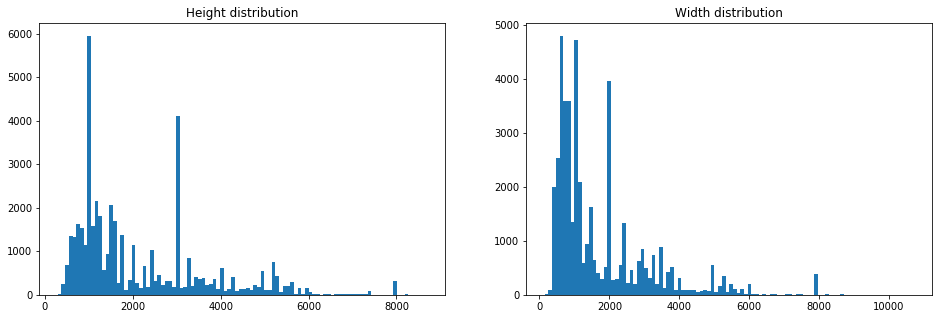

In [9]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
ax1.hist(image_shape_df['Height'], bins=100)
ax1.set_title("Height distribution")
ax2.hist(image_shape_df['Width'], bins=100)
ax2.set_title("Width distribution")
plt.show()

## Details about Classes and Attributes

The label_desc json file provides details about classes and attributes of the images.
There are 46 different categories for the masks, and each mask can contain any of the 294 attributes.

In [10]:
label_desc

{'attributes': [{'id': 0,
   'level': 1,
   'name': 'classic (t-shirt)',
   'supercategory': 'nickname'},
  {'id': 1, 'level': 1, 'name': 'polo (shirt)', 'supercategory': 'nickname'},
  {'id': 2, 'level': 1, 'name': 'undershirt', 'supercategory': 'nickname'},
  {'id': 3, 'level': 1, 'name': 'henley (shirt)', 'supercategory': 'nickname'},
  {'id': 4,
   'level': 1,
   'name': 'ringer (t-shirt)',
   'supercategory': 'nickname'},
  {'id': 5,
   'level': 1,
   'name': 'raglan (t-shirt)',
   'supercategory': 'nickname'},
  {'id': 6, 'level': 1, 'name': 'rugby (shirt)', 'supercategory': 'nickname'},
  {'id': 7, 'level': 1, 'name': 'sailor (shirt)', 'supercategory': 'nickname'},
  {'id': 8, 'level': 1, 'name': 'crop (top)', 'supercategory': 'nickname'},
  {'id': 9, 'level': 1, 'name': 'halter (top)', 'supercategory': 'nickname'},
  {'id': 10, 'level': 1, 'name': 'camisole', 'supercategory': 'nickname'},
  {'id': 11, 'level': 1, 'name': 'tank (top)', 'supercategory': 'nickname'},
  {'id': 12, 

In [11]:
num_classes = len(label_desc['categories'])
num_attributes = len(label_desc['attributes'])
print(num_classes)
print(num_attributes)

46
294


In [12]:
categories_df = pd.DataFrame(label_desc['categories'])
attributes_df = pd.DataFrame(label_desc['attributes'])

In [13]:
categories_df

,id,level,name,supercategory
0,0,2,"shirt, blouse",upperbody
1,1,2,"top, t-shirt, sweatshirt",upperbody
2,2,2,sweater,upperbody
3,3,2,cardigan,upperbody
4,4,2,jacket,upperbody
5,5,2,vest,upperbody
6,6,2,pants,lowerbody
7,7,2,shorts,lowerbody
8,8,2,skirt,lowerbody
9,9,2,coat,wholebody


In [40]:
categories_df.name.unique()

array(['shirt, blouse', 'top, t-shirt, sweatshirt', 'sweater', 'cardigan',
       'jacket', 'vest', 'pants', 'shorts', 'skirt', 'coat', 'dress',
       'jumpsuit', 'cape', 'glasses', 'hat',
       'headband, head covering, hair accessory', 'tie', 'glove', 'watch',
       'belt', 'leg warmer', 'tights, stockings', 'sock', 'shoe',
       'bag, wallet', 'scarf', 'umbrella', 'hood', 'collar', 'lapel',
       'epaulette', 'sleeve', 'pocket', 'neckline', 'buckle', 'zipper',
       'applique', 'bead', 'bow', 'flower', 'fringe', 'ribbon', 'rivet',
       'ruffle', 'sequin', 'tassel'], dtype=object)

In [41]:
attributes_df

,id,level,name,supercategory
0,0,1,classic (t-shirt),nickname
1,1,1,polo (shirt),nickname
2,2,1,undershirt,nickname
3,3,1,henley (shirt),nickname
4,4,1,ringer (t-shirt),nickname
5,5,1,raglan (t-shirt),nickname
6,6,1,rugby (shirt),nickname
7,7,1,sailor (shirt),nickname
8,8,1,crop (top),nickname
9,9,1,halter (top),nickname


In [42]:
#attributes_df.name.unique()

### Class-wise distribution of segments in training dataset

In [14]:
category_map, attribute_map = {}, {}
for cat in label_desc.get('categories'):
    category_map[cat.get('id')] = cat.get('name')
for attr in label_desc.get('attributes'):
    attribute_map[attr.get('id')] = attr.get('name')

In [15]:
train_df['ClassIdCat'] = train_df['ClassId'].map(category_map)
train_df['ClassIdCat'] = train_df['ClassId'].astype('category')

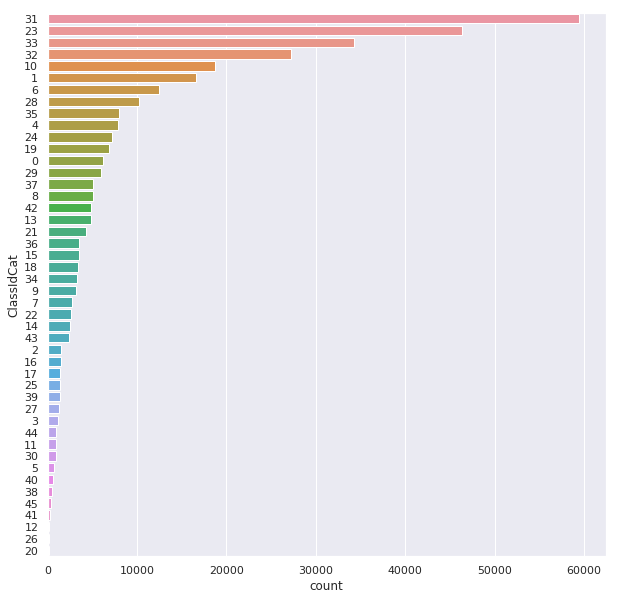

In [16]:
import seaborn as sns
sns.set(style='darkgrid')
fig, ax = plt.subplots(figsize = (10,10))
sns.countplot(y='ClassIdCat',data=train_df , ax=ax, order = train_df['ClassIdCat'].value_counts().index)
fig.show()

In [57]:
train_df.head(5)

,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds,ClassIdCat
0,00000663ed1ff0c4e0132b9b9ac53f6e,6068157 7 6073371 20 6078584 34 6083797 48 608...,5214,3676,6,"115,136,143,154,230,295,316,317",6
1,00000663ed1ff0c4e0132b9b9ac53f6e,6323163 11 6328356 32 6333549 53 6338742 75 63...,5214,3676,0,"115,136,142,146,225,295,316,317",0
2,00000663ed1ff0c4e0132b9b9ac53f6e,8521389 10 8526585 30 8531789 42 8537002 46 85...,5214,3676,28,163,28
3,00000663ed1ff0c4e0132b9b9ac53f6e,12903854 2 12909064 7 12914275 10 12919485 15 ...,5214,3676,31,"160,204",31
4,00000663ed1ff0c4e0132b9b9ac53f6e,10837337 5 10842542 14 10847746 24 10852951 33...,5214,3676,32,219,32


## Plotting a few images with given segments

In [58]:
def create_mask(size):
    #Grab the first *size* images ids
    image_ids = train_df['ImageId'].unique()[:size]
    images_meta=[]

    for image_id in image_ids:
        img = mpimg.imread('/Akamai/rgradilla/final_project/imaterialist/train/%s.jpg' % (image_id))
        images_meta.append({
            'image': img,
            'shape': img.shape,
            'encoded_pixels': train_df[train_df['ImageId'] == image_id]['EncodedPixels'],
            'class_ids':  train_df[train_df['ImageId'] == image_id]['ClassId']
        })

    masks = []
    for image in images_meta:
        shape = image.get('shape')
        encoded_pixels = list(image.get('encoded_pixels'))
        class_ids = list(image.get('class_ids'))
        
        # Initialize numpy array with shape same as image size
        height, width = shape[:2]
        mask = np.zeros((height, width)).reshape(-1)
        
        # Iterate over encoded pixels and create mask
        for segment, (pixel_str, class_id) in enumerate(zip(encoded_pixels, class_ids)):
            splitted_pixels = list(map(int, pixel_str.split()))
            pixel_starts = splitted_pixels[::2]
            run_lengths = splitted_pixels[1::2]
            assert max(pixel_starts) < mask.shape[0]
            for pixel_start, run_length in zip(pixel_starts, run_lengths):
                pixel_start = int(pixel_start) - 1
                run_length = int(run_length)
                mask[pixel_start:pixel_start+run_length] = 255 - class_id * 4
        masks.append(mask.reshape((height, width), order='F'))  # https://stackoverflow.com/questions/45973722/how-does-numpy-reshape-with-order-f-work
    return masks, images_meta

In [59]:
def plot_segmented_images(size=12, figsize=(14, 14)):
    # First create masks from given segments
    masks, images_meta = create_mask(size)
    
    # Plot images in groups of 4 images
    n_groups = 4
    
    count = 0
    for index in range(size // 4):
        fig, ax = plt.subplots(nrows=2, ncols=2, figsize=figsize)
        for row in ax:
            for col in row:
                col.imshow(images_meta[count]['image'])
                col.imshow(masks[count], alpha=0.75)
                col.axis('off')
                count += 1
        plt.show()
    gc.collect()

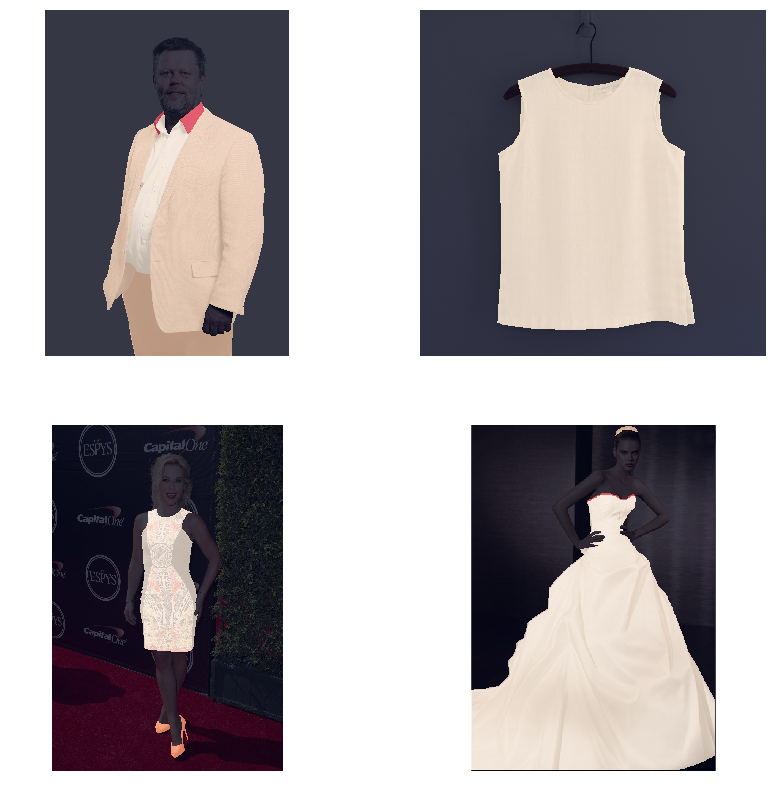

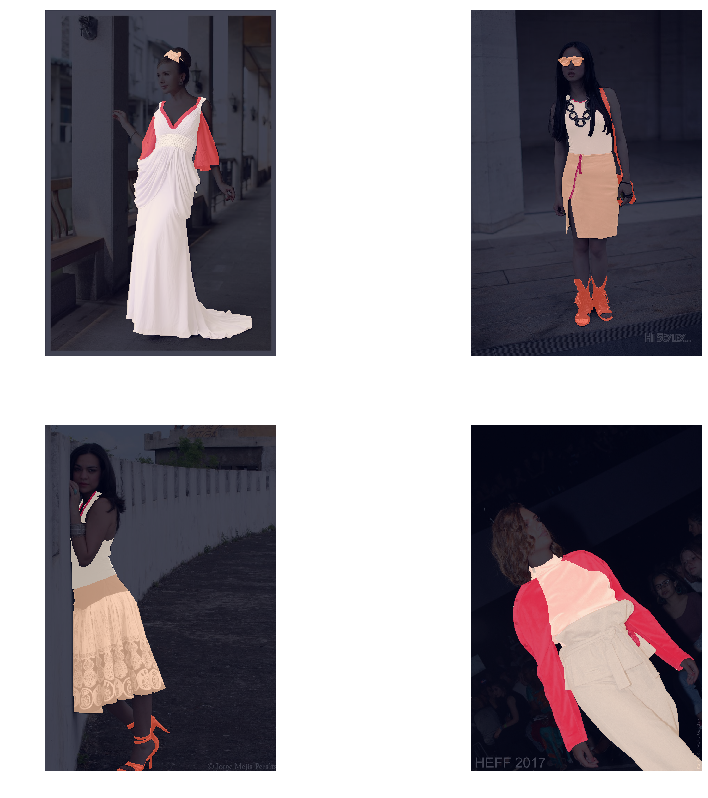

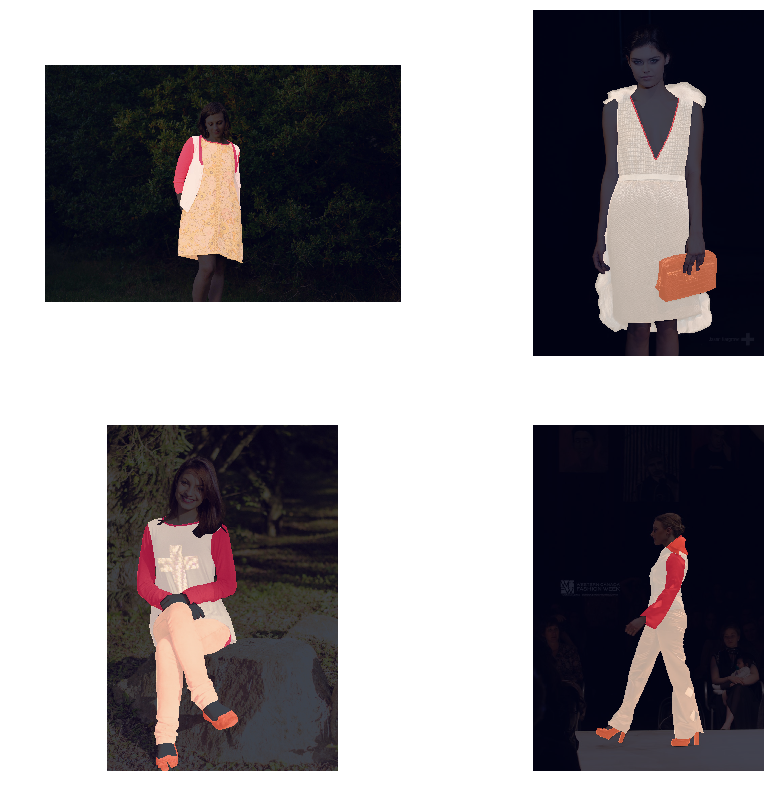

In [60]:
plot_segmented_images()

In [135]:
#x = create_mask(2)
#x

### Let's visualize an image with all its classes and attributes

In [62]:
IMAGE_ID = '0a48b86f33fd88f9a416bdded856c470'

vis_df = train_df[train_df['ImageId'] == IMAGE_ID]
vis_df['ClassId'] = vis_df['ClassId'] #.cat.codes
vis_df = vis_df.reset_index(drop=True)
vis_df

/Akamai/rgradilla/rosaenv3/lib/python3.5/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds,ClassIdCat
0,0a48b86f33fd88f9a416bdded856c470,283691 2 284690 9 285690 14 286689 20 287689 2...,1000,667,23,NaN,23
1,0a48b86f33fd88f9a416bdded856c470,314886 10 315879 22 316876 27 317872 32 318869...,1000,667,23,NaN,23
2,0a48b86f33fd88f9a416bdded856c470,199305 1 200304 3 201303 5 202302 6 203300 9 2...,1000,667,9,"115,149,226,295,311,317",9
3,0a48b86f33fd88f9a416bdded856c470,204408 4 205406 11 206387 5 206403 16 207381 1...,1000,667,31,160,31
4,0a48b86f33fd88f9a416bdded856c470,415410 9 416396 28 417388 41 418385 48 419367 ...,1000,667,31,"160,204",31
5,0a48b86f33fd88f9a416bdded856c470,199305 1 200304 3 201303 5 202302 6 203300 9 2...,1000,667,29,178,29
6,0a48b86f33fd88f9a416bdded856c470,457507 4 458507 11 459507 15 460507 15 461507 ...,1000,667,36,NaN,36
7,0a48b86f33fd88f9a416bdded856c470,243565 14 244539 40 245488 91 246484 95 247481...,1000,667,10,"128,149,316,317",10
8,0a48b86f33fd88f9a416bdded856c470,310237 2 311234 6 312233 8 313234 8 314236 7 3...,1000,667,33,182,33
9,0a48b86f33fd88f9a416bdded856c470,350550 2 351546 6 352543 9 353539 13 354535 17...,1000,667,32,218,32


[]

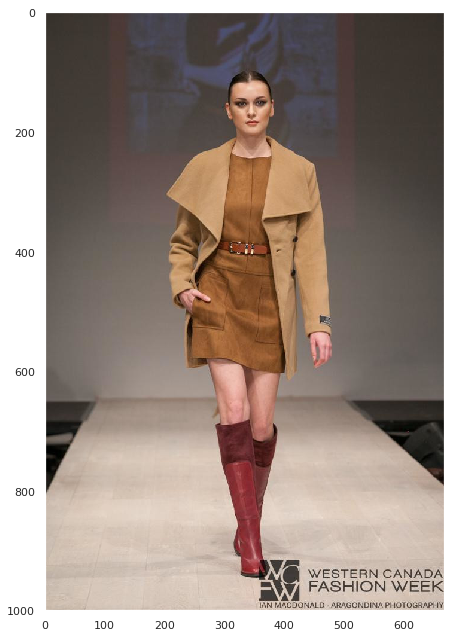

In [63]:
# Plot plain image
plt.figure(figsize = (110,11))
image = mpimg.imread('/Akamai/rgradilla/final_project/imaterialist/train/{}.jpg'.format(IMAGE_ID))
plt.grid(False)
plt.imshow(image)
plt.plot()

### All masks for this image are: 

In [64]:
train_df[train_df['ImageId'] == IMAGE_ID]

,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds,ClassIdCat
13274,0a48b86f33fd88f9a416bdded856c470,283691 2 284690 9 285690 14 286689 20 287689 2...,1000,667,23,NaN,23
13275,0a48b86f33fd88f9a416bdded856c470,314886 10 315879 22 316876 27 317872 32 318869...,1000,667,23,NaN,23
13276,0a48b86f33fd88f9a416bdded856c470,199305 1 200304 3 201303 5 202302 6 203300 9 2...,1000,667,9,"115,149,226,295,311,317",9
13277,0a48b86f33fd88f9a416bdded856c470,204408 4 205406 11 206387 5 206403 16 207381 1...,1000,667,31,160,31
13278,0a48b86f33fd88f9a416bdded856c470,415410 9 416396 28 417388 41 418385 48 419367 ...,1000,667,31,"160,204",31
13279,0a48b86f33fd88f9a416bdded856c470,199305 1 200304 3 201303 5 202302 6 203300 9 2...,1000,667,29,178,29
13280,0a48b86f33fd88f9a416bdded856c470,457507 4 458507 11 459507 15 460507 15 461507 ...,1000,667,36,NaN,36
13281,0a48b86f33fd88f9a416bdded856c470,243565 14 244539 40 245488 91 246484 95 247481...,1000,667,10,"128,149,316,317",10
13282,0a48b86f33fd88f9a416bdded856c470,310237 2 311234 6 312233 8 313234 8 314236 7 3...,1000,667,33,182,33
13283,0a48b86f33fd88f9a416bdded856c470,350550 2 351546 6 352543 9 353539 13 354535 17...,1000,667,32,218,32


In [68]:
len(list(train_df[train_df['ImageId'] == IMAGE_ID]['ClassId']))

13

### Now let's plot each segment in a separate image:

In [134]:
segments = list(vis_df['EncodedPixels'])
class_ids = list(vis_df['ClassId'])
masks = []


for segment, class_id in zip(segments, class_ids):
    
    height = vis_df['Height'][0]
    width = vis_df['Width'][0]
    # Initialize empty mask
    mask = np.zeros((height, width)).reshape(-1)
    
    # Iterate over encoded pixels and create mask
    splitted_pixels = list(map(int, segment.split()))
    pixel_starts = splitted_pixels[::2]
    run_lengths = splitted_pixels[1::2]
    assert max(pixel_starts) < mask.shape[0]
    for pixel_start, run_length in zip(pixel_starts, run_lengths):
        pixel_start = int(pixel_start) - 1
        run_length = int(run_length)
        mask[pixel_start:pixel_start+run_length] = 255 - class_id * 4

    mask = mask.reshape((height, width), order='F')
    masks.append(mask)
    
print('There are {} segments, type is {}'.format(len(segments), type(segments)))
print('There are {} class_ids'.format(len(class_ids)))
print('There are {} masks'.format(len(masks)))

print(class_ids)

There are 13 segments, type is <class 'list'>
There are 13 class_ids
There are 13 masks
[23, 23, 9, 31, 31, 29, 36, 10, 33, 32, 32, 19, 34]


### EncodedPixel to mask (tangential)

In [124]:
segment = segments[0] #type = string
class_id = class_ids[0] #type=string

print('Segment is: {} and its type is {}'.format(len(segment), type(segment)))
print('Class is: {} and its type is {}'.format(class_id, type(class_id)))

Segment is: 931 and its type is <class 'str'>
Class is: 23 and its type is <class 'int'>


In [133]:
height = vis_df['Height'][0] #1000
width = vis_df['Width'][0] #667
# Initialize empty mask .reshape(-1) flattens the pixels
mask = np.zeros((height, width)).reshape(-1) #mask.shape = 667000

# Iterate over encoded pixels and create mask

# map
splitted_pixels = list(map(int, segment.split())) #list

#splitted_pixels:
#[283691,
# 2,
# 284690,
# 9,
# 285690,
# 14,
# 286689,

# pixel starts every 2nd element
pixel_starts = splitted_pixels[::2]
# mask runs
run_lengths = splitted_pixels[1::2]
assert max(pixel_starts) < mask.shape[0]

for pixel_start, run_length in zip(pixel_starts, run_lengths):
    pixel_start = int(pixel_start) - 1
    run_length = int(run_length)
    mask[pixel_start:pixel_start+run_length] = 255 - class_id * 4
        
    mask = mask.reshape((height, width), order='F')

#pairs of values that contain a start position and a run length. 
#E.g. '1 3' implies starting at pixel 1 and running a total of 3 pixels (1,2,3).

mask.shape

(667000,)

In [140]:
def plot_individual_segment(*masks, image, figsize=(100,120)): #figsize=(110, 11)):
    plt.figure(figsize = figsize)
    plt.imshow(image)
    for mask in masks:
        plt.imshow(mask, alpha=0.6)
    plt.axis('off')
    plt.show()

23


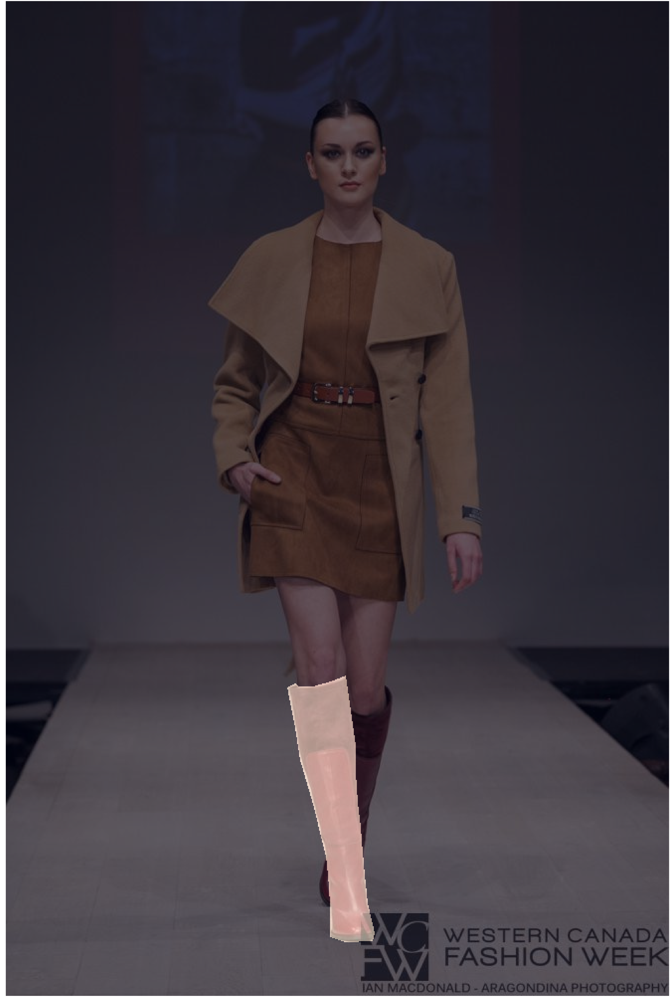

23


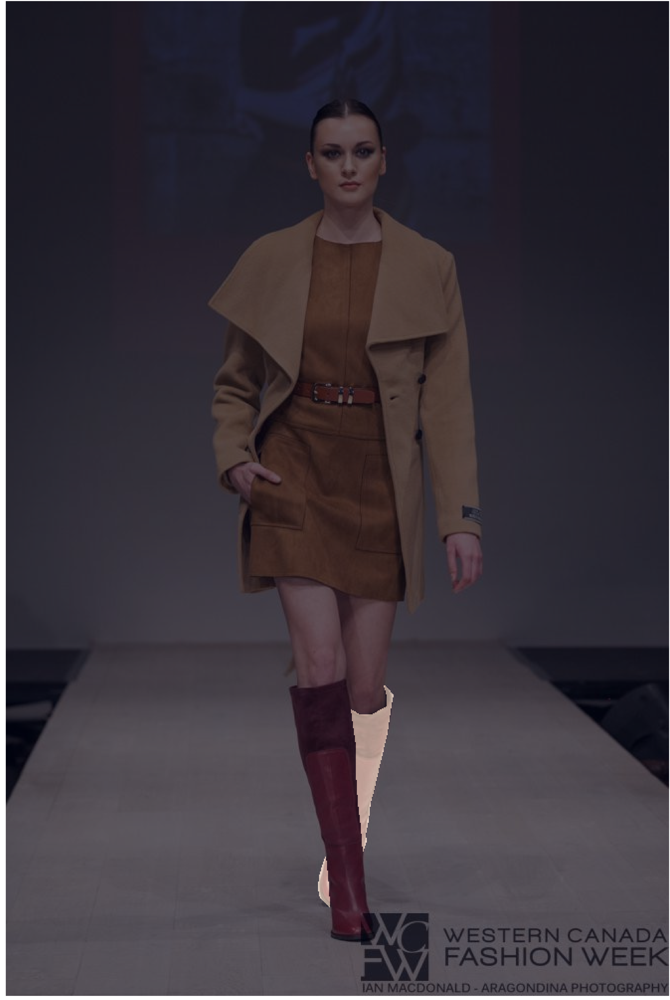

9


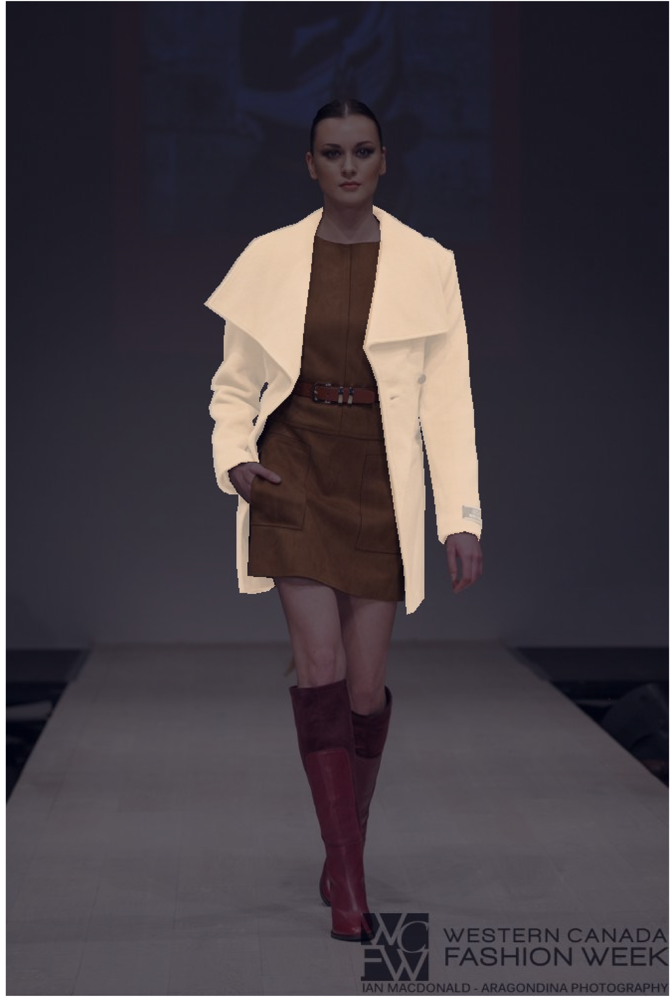

31


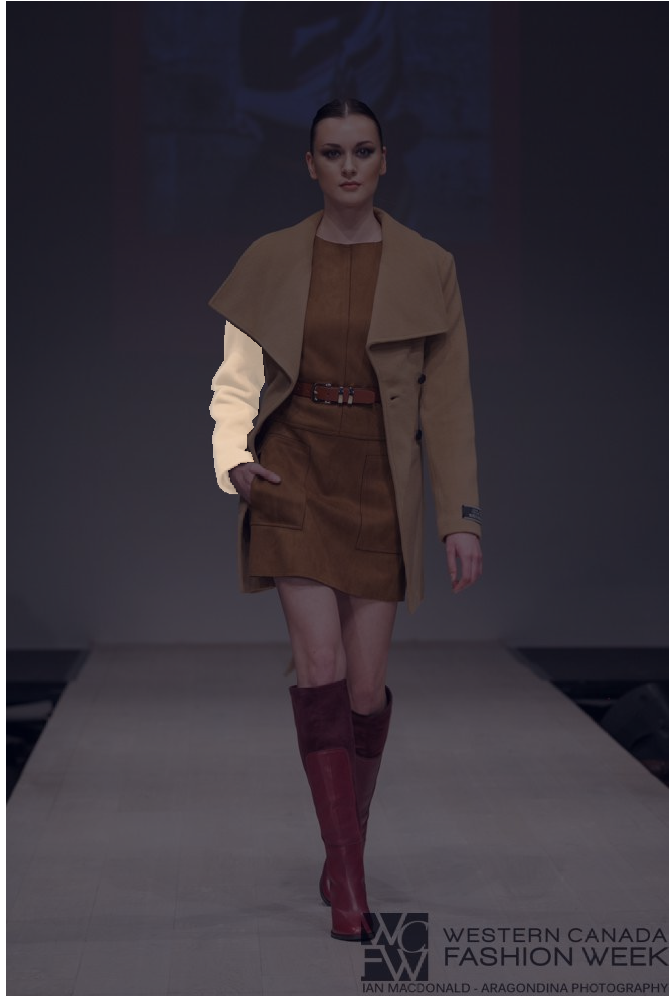

31


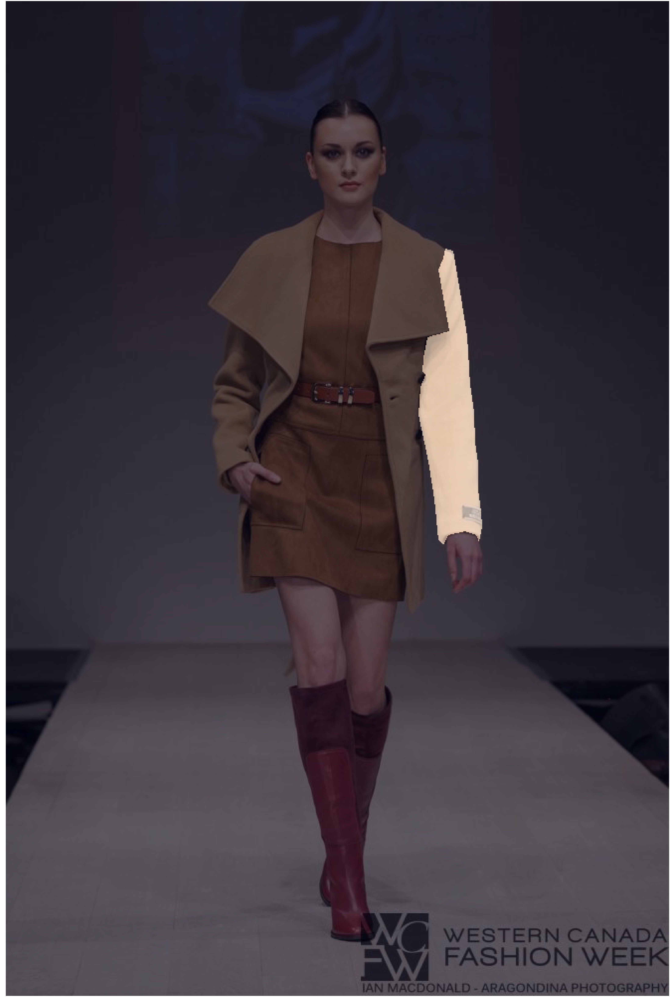

29


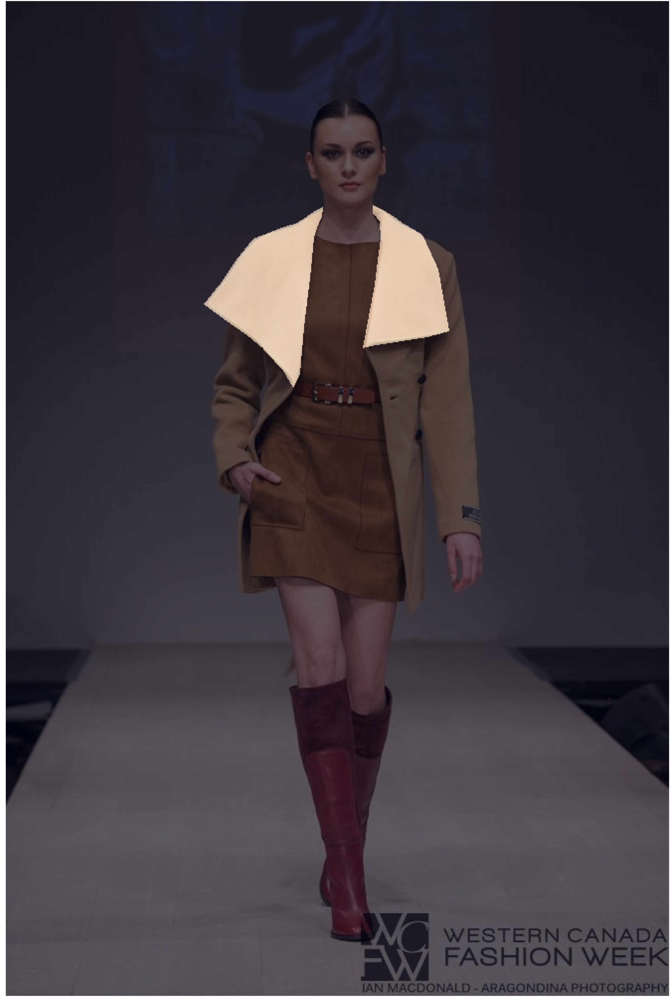

36


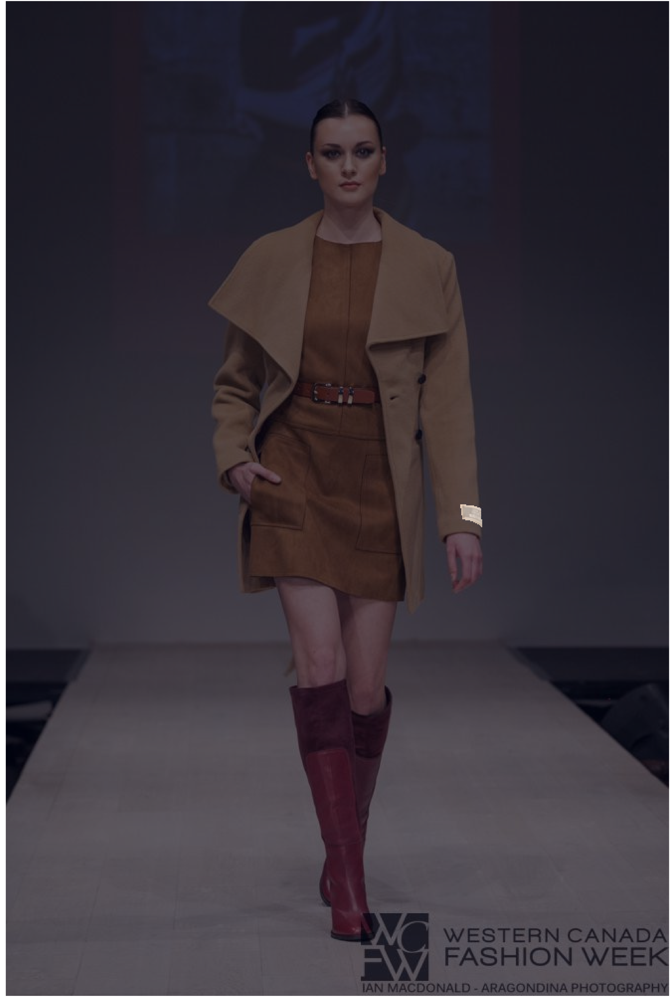

10


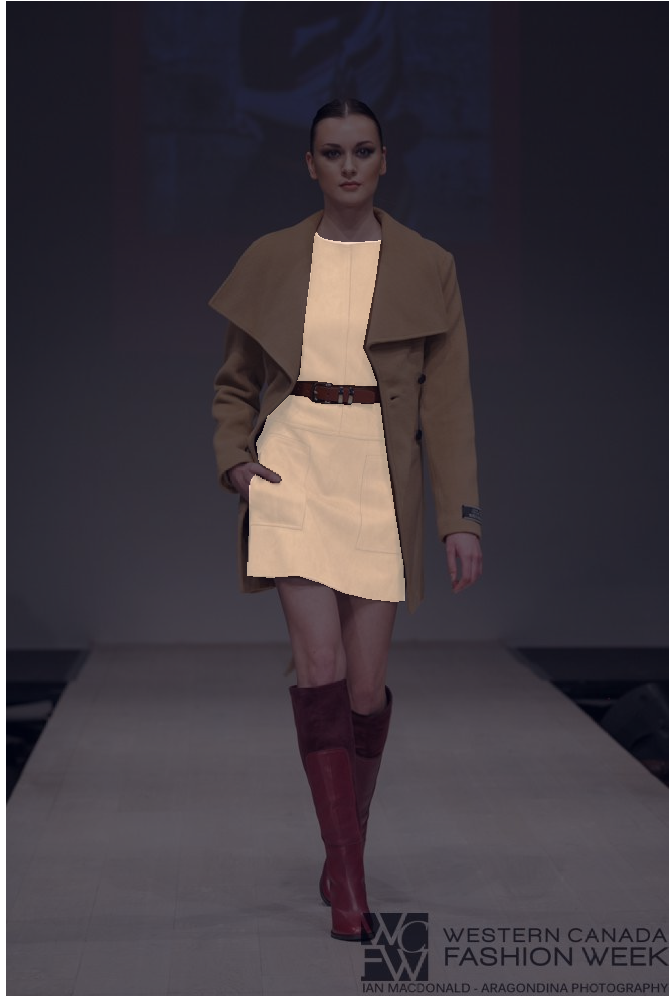

33


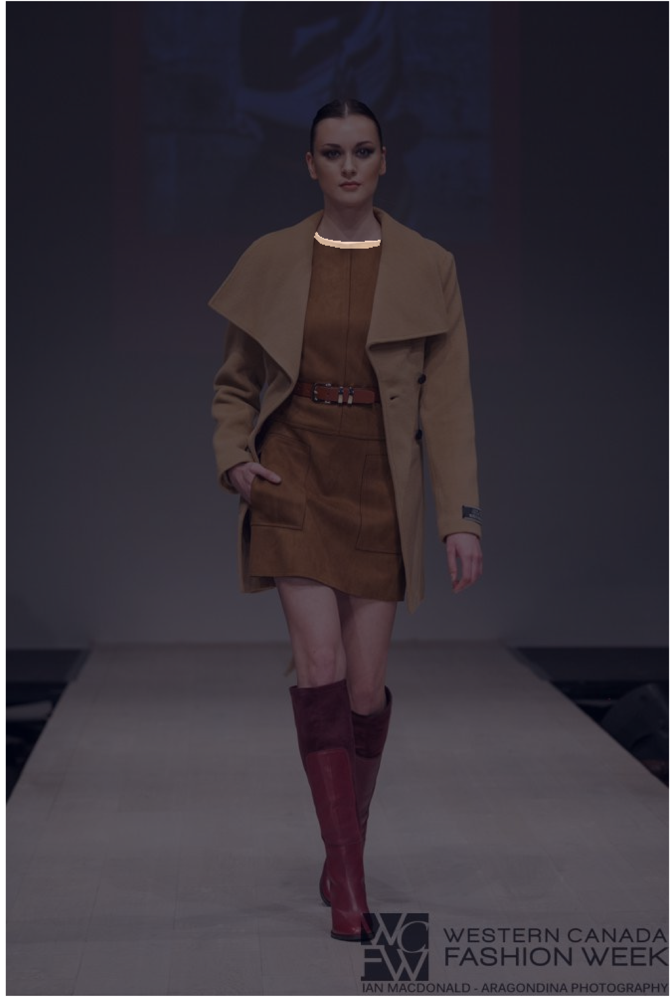

32


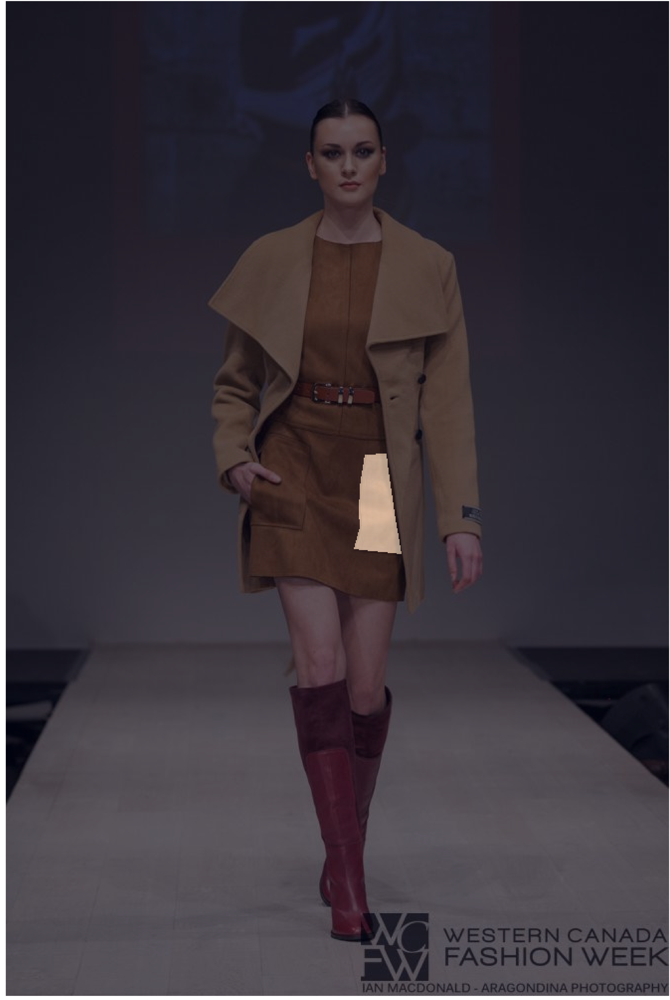

32


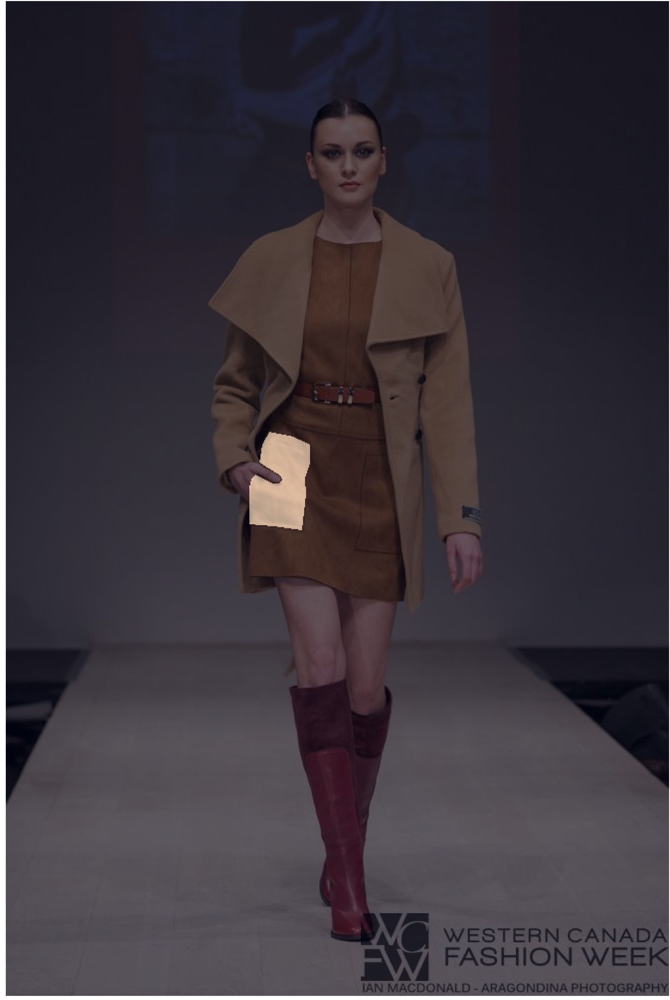

19


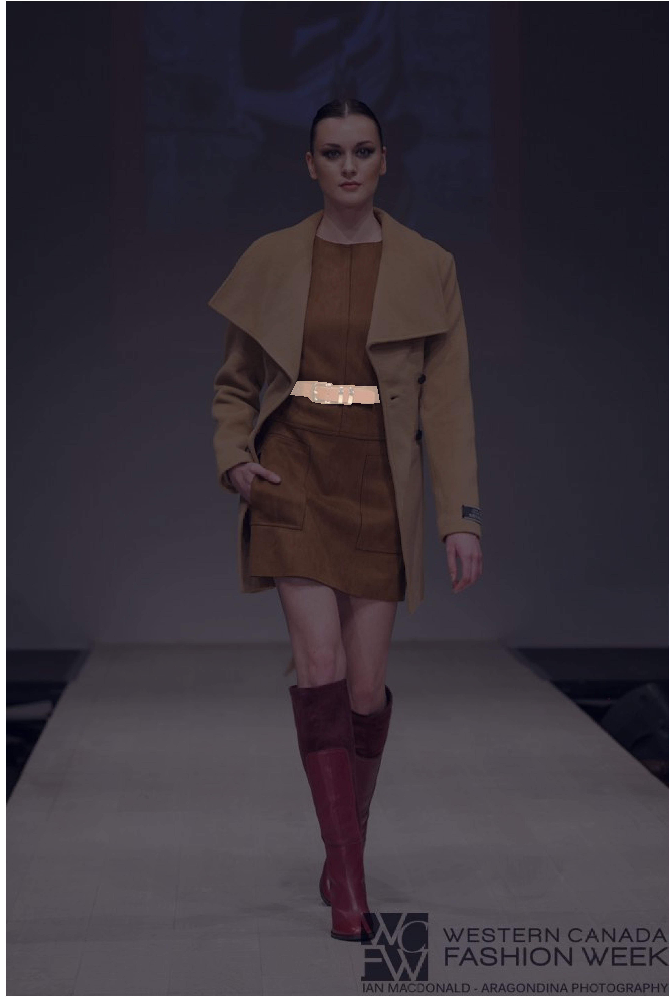

34


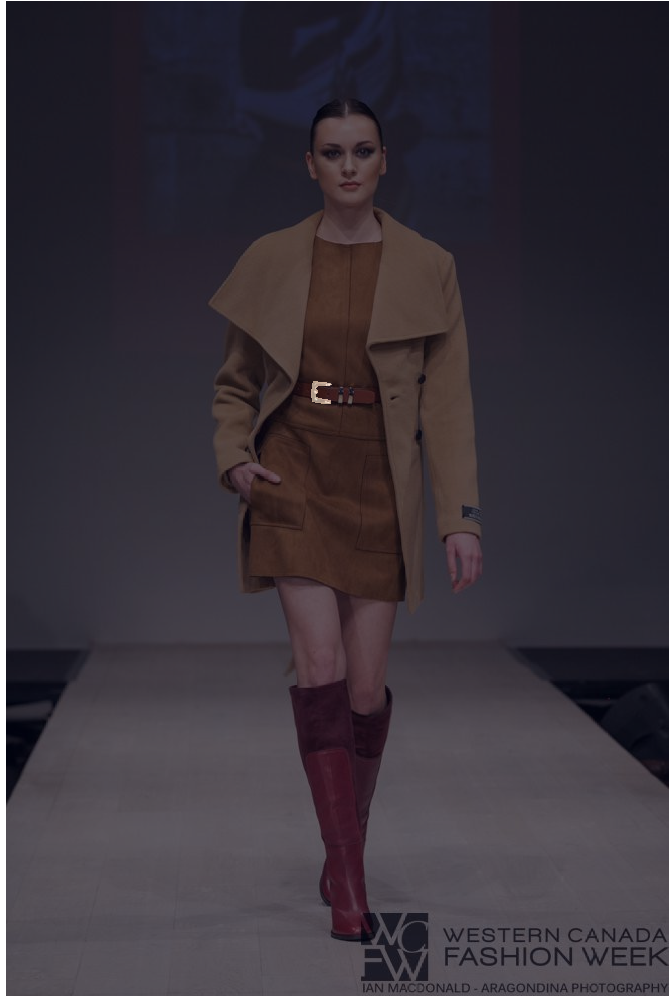

In [141]:
for i in range(13):
    print(class_ids[i])
    plot_individual_segment(masks[i], image=image)